In [1]:
import kline
import stock
import trend
import choose
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import Formatter
import math

# 计算分类的成交量能量线

In [2]:
"""装入一个分类的所有数据并对齐，返回一个大的矩阵"""
def LoadCategoryCompanys(categoryName):
    companys = stock.query("""select * from company_select where category='%s'"""%(categoryName))

    C,K,D = stock.loadKline('SZ:399001') #和深圳成指对齐
    KS = np.zeros((len(companys),len(K),5))
    i = 0
    for c in companys:
        c,k,d = stock.loadKline(c[1])
        KS[i] = stock.alignK(D,k,d)
        i+=1
    stock.closedb()
    return companys,KS,D

def LoadCategory():
    categorys = stock.query("""select id,name from category""")
    stock.closedb()
    
    return categorys

def UpdateCategoryEnergy(idd,date,ve20,volume):
    for i in range(len(ve20)):
        stock.cursor.execute("""insert ignore into category_energy values (%d,'%s',%f,%f)"""%(idd,date[i][0],ve20[i],volume[i]))    
    stock.closedb()
    
def calcAllCategoryVolume():
    cats = LoadCategory()
    for c in cats:
        print('处理:',c[1])
        companys,K,D = LoadCategoryCompanys(c[1])
        volume = np.zeros((K.shape[1]))
        for i in range(K.shape[1]):
            volume[i] = K[:,i,0].sum()
        ve20 = stock.volumeEnergy(volume,20)
        UpdateCategoryEnergy(c[0],D,ve20,volume)
    print('处理完成',len(cats),'个分类')
    
def clearCatgory(): #将不使用的分类删除
    cats = LoadCategory()
    
    for c in cats:
        companys = stock.query("""select * from company_select where category='%s'"""%(c[1]))
        if len(companys)==0:
            stock.execute("""delete from category where name='%s'"""%(c[1]))
    stock.closedb()

In [3]:
def loadCatgoryVolumeEnergy(idd):
    ve20 = stock.query("""select ve20 from category_energy where id=%d"""%(idd))
    stock.closedb()
    return np.array(ve20).reshape(-1)

class MyFormatter(Formatter):
    def __init__(self, dates, fmt='%Y-%m-%d'):
        self.dates = dates
        self.fmt = fmt

    def __call__(self, x, pos=0):
        'Return the label for time x at position pos'
        ind = int(np.round(x))
        if ind >= len(self.dates) or ind < 0 or math.ceil(x)!=math.floor(x):
            return ''
        t = self.dates[ind][0]
        return '%s-%s-%s'%(t.year,t.month,t.day)
    
def CatgoryVolumeEnergyPlote():
    cats = LoadCategory()
    i = 0
    cc,kk,dd = stock.loadKline('SZ:399001')
    vv = stock.volumeEnergyK(kk)
    KDJ = stock.kdj(vv)
    for c in cats:
        fig, axs = plt.subplots(1, 1,sharex=True,figsize=(36,5))
        axs.xaxis.set_major_formatter(MyFormatter(dd))        
        ve20 = loadCatgoryVolumeEnergy(c[0])
        x = np.arange(len(ve20))
        kdJ = stock.kdj(ve20,9)
        axs.plot(x[-400:-1],kdJ[-400:-1,2],label=c[1])
        axs.plot(x[-400:-1],KDJ[-400:-1,2],label='深证成指')
        axs.axhline(0,color='green',linestyle='-.')
        axs.axhline(100,color='red',linestyle='-.')
        i += 1
        axs.legend()

d:\python\python37\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


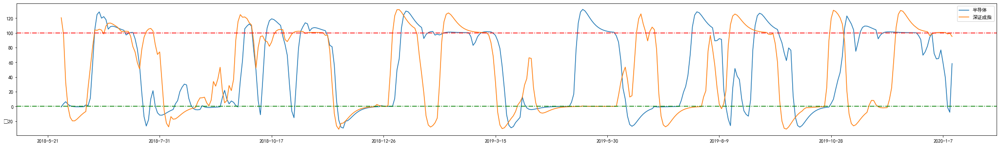

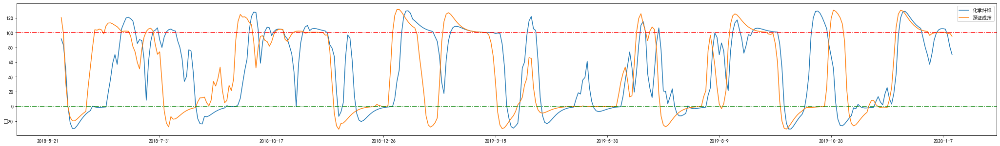

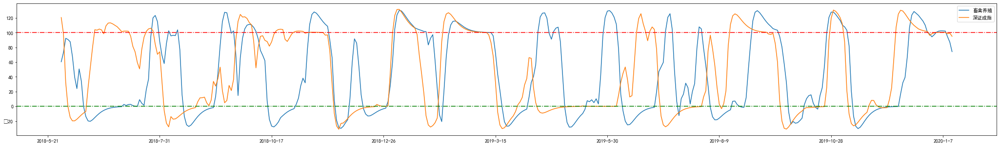

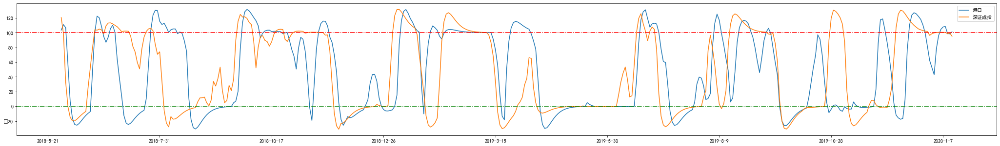

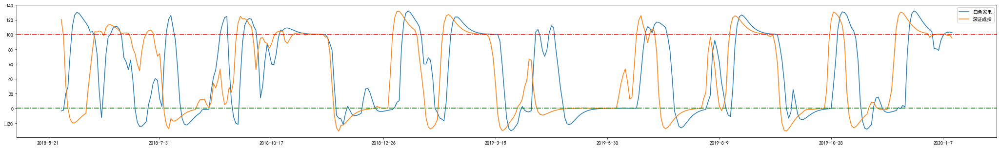

...

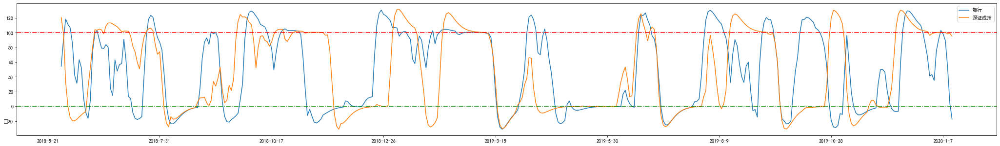

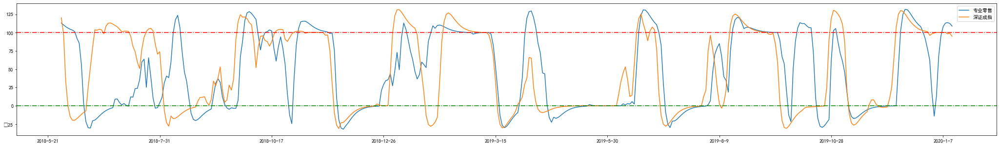

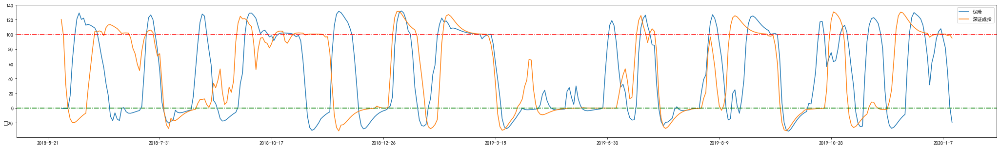

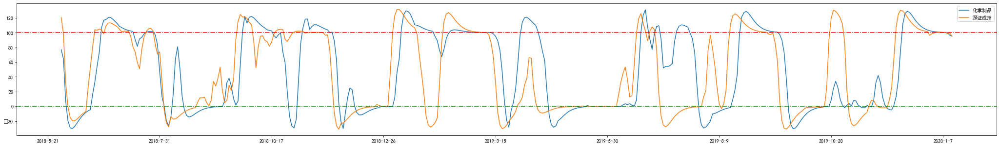

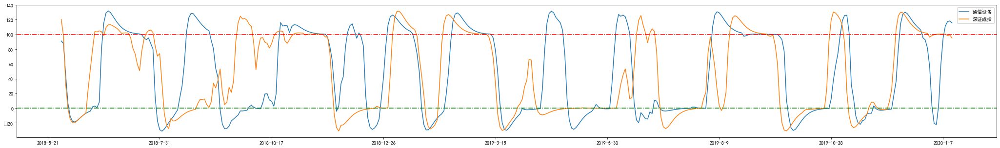

In [4]:
CatgoryVolumeEnergyPlote()